In [2]:
using Plots
using StatsPlots
using StatsBase
using Statistics

# Relating Time

The goal of this notebook is to use the 10s synchronisation flags to temporally relate the O2 and LFP data. 

## Data Importing

This section will focus on importing the LFP and O2 data along with the synchronisation flags. This notebook will be using Experiment 2 Recording 7.

In [1]:
include("../helpers/importing.jl")
lfp = import_lfp("Exp 2/R7/2022-05-11_17-39-17/Record Node 101/")
o2 = import_o2("Exp 2/R7/o2 r7.txt")

Dict{String, Vector{Float32}} with 4 entries:
  "laser"      => [328293.0, 450314.0, 495567.0, 535427.0, 627203.0, 731830.0, …
  "sync"       => [30452.0, 40944.0, 51395.0, 61876.0, 72372.0, 82849.0, 93294.…
  "data"       => [-269.721, -269.721, -269.721, -269.721, -269.721, -269.721, …
  "timestamps" => [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0  …  1.5976f…

## Plotting Flag Offset

This section will focus on plotting the difference between the LFP and O2 sync flags.

Note: the LFP flags are recorded as on/off pairs so there are two times as many of them.

In [3]:
println("There are $(length(lfp["sync"]["on"])) LFP sync flags")
println("There are $(length(o2["sync"])) O2 sync flags")

There are 153 LFP sync flags
There are 150 O2 sync flags


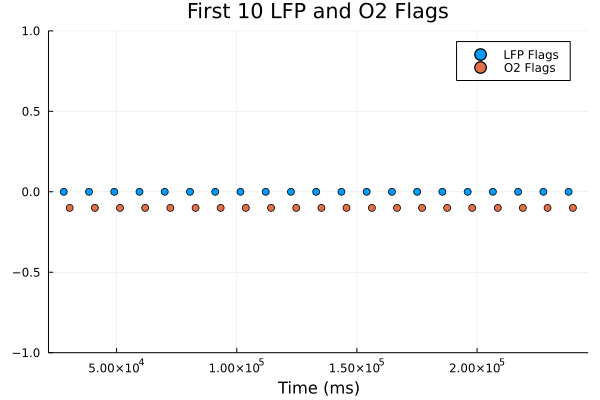

In [4]:
start = 1
interval = 20

scatter(lfp["sync"]["on"][start:start+interval], zeros(length(lfp["sync"]["on"][start:start+interval])), label="LFP Flags")
scatter!(o2["sync"][start:start+interval], zeros(length(o2["sync"][start:start+interval])).-0.1, label="O2 Flags", ylims=(-1,1))

title!("First 10 LFP and O2 Flags")
xlabel!("Time (ms)")

## Correcting Flag Offset

### Approach 1: Average Offset

My first intuition about the misalignment of the flags is that they are offset by an average value.

In [5]:
o2_start = findall(x->x==o2["sync"][1], o2["timestamps"])[1]
o2_end = findall(x->x==o2["sync"][10], o2["timestamps"])[1]

lfp_start= findmin(abs.(lfp["timestamps"].-lfp["sync"]["on"][1]))[2]
lfp_end= findmin(abs.(lfp["timestamps"].-lfp["sync"]["on"][10]))[2]

println("O2 range: [$(o2_start), $(o2_end)]")
println("LFP range: [$(lfp_start), $(lfp_end)]") 

O2 range: [30453, 124761]
LFP range: [2200, 96743]


In [6]:
plot(lfp["timestamps"][lfp_start:lfp_end], lfp["data"][1, lfp_start:lfp_end], label="LFP Data")
o2_norm = standardize(ZScoreTransform, o2["data"])
plot!(o2["timestamps"][o2_start:o2_end], o2_norm[o2_start:o2_end], label="O2 Data")

scatter!(lfp["sync"]["on"][1:10], zeros(10), label="LFP Flags")
scatter!(o2["sync"][1:10], zeros(10), label="O2 Flags")

title!("O2 and LFP Data After Time Correction")
xlabel!("Time [ms]")

In [7]:
total_diff = 0 
for i in 1:10
    total_diff += o2["sync"][i] - lfp["sync"]["on"][i] 
end
avg_diff = total_diff / 10

2326.3

In [8]:
plot(lfp["timestamps"][lfp_start:lfp_end], lfp["data"][lfp_start:lfp_end], label="LFP Data")
plot!(o2["timestamps"][o2_start:o2_end].-avg_diff, o2_norm[o2_start:o2_end], label="O2 Data")

scatter!(lfp["sync"]["on"][1:10], zeros(10), label="LFP Flags")
scatter!(o2["sync"][1:10].-avg_diff, ones(10), label="O2 Flags")
title!("O2 and LFP Data After Time Correction")
xlabel!("Time [ms]")

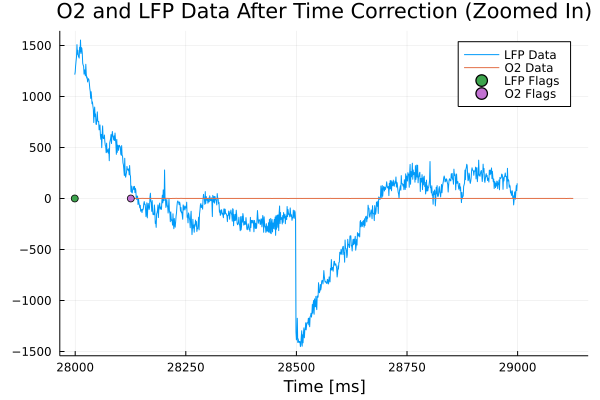

In [9]:
plot(lfp["timestamps"][lfp_start:lfp_start+1000], lfp["data"][1, lfp_start:lfp_start+1000], label="LFP Data")
plot!(o2["timestamps"][o2_start:o2_start+1000].-avg_diff, o2_norm[o2_start:o2_start+1000], label="O2 Data")

scatter!([lfp["sync"]["on"][1]], [0], label="LFP Flags")
scatter!([o2["sync"][1]-avg_diff], [0], label="O2 Flags")
title!("O2 and LFP Data After Time Correction (Zoomed In)")
xlabel!("Time [ms]")

This first approach has not been successful as it seams a linear offset does not cause the sync flags to become fully aligned, even within a very small subset of the data.

### Approach 2: Aligning the first data point only

This approach assumes that the only flag alignment error comes from the first flag only.

In [10]:
diff = o2["sync"][1] - lfp["sync"]["on"][1]

2453.0

In [11]:
plot(lfp["timestamps"][lfp_start:lfp_end], lfp["data"][1, lfp_start:lfp_end], label="LFP Data")
plot!(o2["timestamps"][o2_start:o2_end].-diff, o2_norm[o2_start:o2_end], label="O2 Data")

scatter!(lfp["sync"]["on"][1:10], zeros(10), label="LFP Flags")
scatter!(o2["sync"][1:10].-diff, ones(10), label="O2 Flags")
title!("O2 and LFP Data After Time Correction")
xlabel!("Time [ms]")

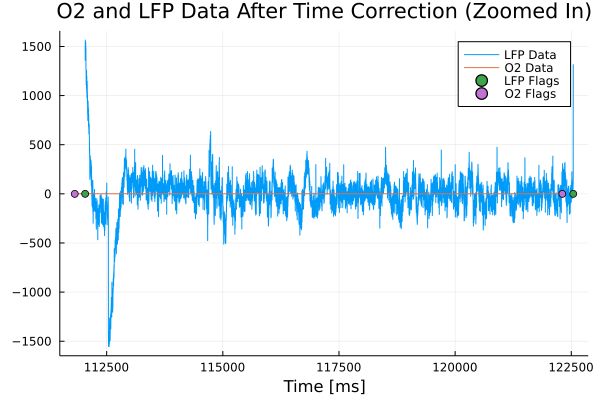

In [12]:
o2_start = findall(x->x==o2["sync"][9], o2["timestamps"])[1]
o2_end = findall(x->x==o2["sync"][10], o2["timestamps"])[1]

lfp_start = findmin(abs.(lfp["timestamps"].-lfp["sync"]["on"][9]))[2]
lfp_end = findmin(abs.(lfp["timestamps"].-lfp["sync"]["on"][10]))[2]

corrected_o2_flags = o2["sync"].-diff
corrected_o2_data = o2["timestamps"].-diff

plot(lfp["timestamps"][lfp_start:lfp_end], lfp["data"][1, lfp_start:lfp_end], label="LFP Data")
plot!(corrected_o2_data[o2_start:o2_end], o2_norm[o2_start:o2_end], label="O2 Data")

scatter!([lfp["sync"]["on"][9:10]], zeros(2), label="LFP Flags")
scatter!([corrected_o2_flags[9:10]], zeros(2).-0.5, label="O2 Flags")
title!("O2 and LFP Data After Time Correction (Zoomed In)")
xlabel!("Time [ms]")

Again this approach has not worked since as you get further out, the error becomes worse with the offset. Next I will try to quantify this offset to get an attempt to figure out if it has been caused by some scaling factor.

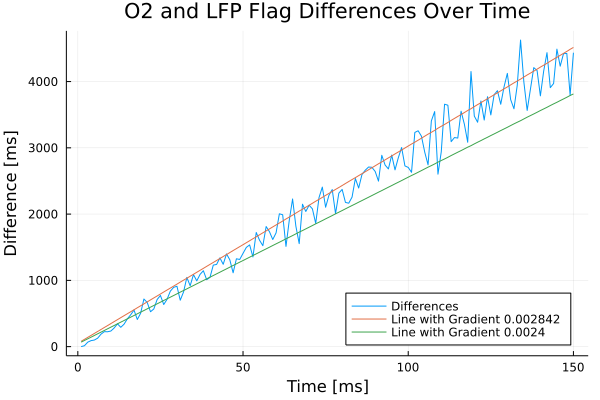

In [13]:
difference = lfp["sync"]["on"][1:length(corrected_o2_flags)] - corrected_o2_flags
plot(difference, label = "Differences", legend=:bottomright)
gradient = difference[end] / (corrected_o2_flags[end] - corrected_o2_flags[1])
plot!([i * gradient for i in corrected_o2_flags], label = "Line with Gradient $(round(gradient, digits=6))")
plot!([i * 0.0024 for i in corrected_o2_flags], label = "Line with Gradient $(0.0024)")

title!("O2 and LFP Flag Differences Over Time")
xlabel!("Time [ms]")
ylabel!("Difference [ms]")

### Approach 3: Offset and Scale datapoints

The previous attempt did not work but it did manage to compute how the offset increases with subsequent sync flags.

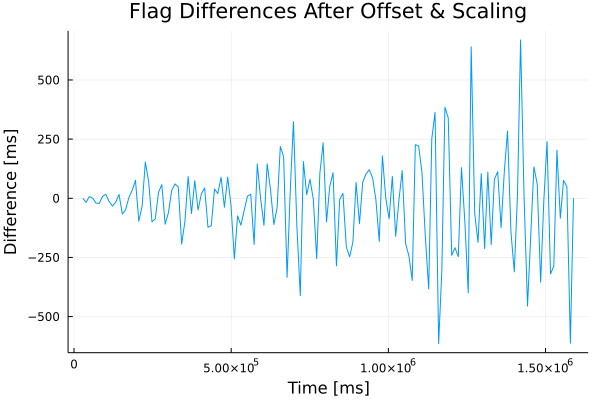

In [14]:
plot(corrected_o2_flags, difference - [i * gradient for i in corrected_o2_flags.-corrected_o2_flags[1]], legend=false)

title!("Flag Differences After Offset & Scaling")
xlabel!("Time [ms]")
ylabel!("Difference [ms]")

As the plots above show, this method works a lot better, except there is too much noise in the flags nearer the end of the recording. 

## Checking Flag Intervals

This section will look at the intervals between each flag to investigate which set of data might be causing the sync problem. Particularly checking the noise that is produced in Approach 3. 

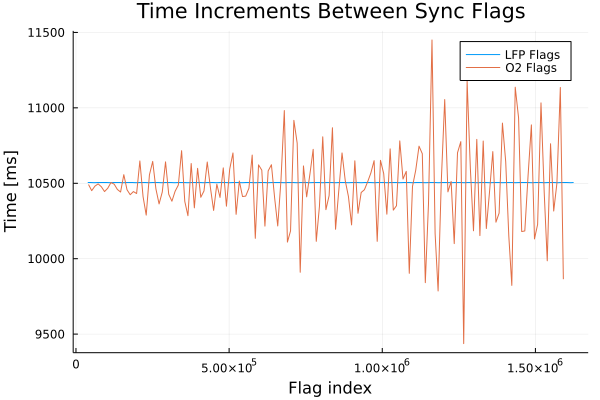

In [15]:
lfp_differences = []
o2_differences = []

for i in 2:length(lfp["sync"]["on"])
    push!(lfp_differences, abs(lfp["sync"]["on"][i-1] - lfp["sync"]["on"][i]))
end

for i in 2:length(o2["sync"])
    push!(o2_differences, abs(o2["sync"][i-1] - o2["sync"][i]))
end 

plot(lfp["sync"]["on"][2:end], lfp_differences, label="LFP Flags")
plot!(o2["sync"][2:end], o2_differences, label="O2 Flags")

title!("Time Increments Between Sync Flags")
xlabel!("Flag index")
ylabel!("Time [ms]")

In [16]:
println("The mean of LFP differences is $(mean(lfp_differences))")
println("The mean of O2 differences is $(mean(o2_differences))")
print("The radio is $(mean(lfp_differences)/mean(o2_differences))")

The mean of LFP differences is 10504.756578947368
The mean of O2 differences is 10474.993
The radio is 1.0028413779769307

The graph above shows that the error in the synchronisation flags is coming entirely from the O2 sync flags. It also shows that they should be at 10.5s intervals, which is consistent with the square wave used (10s off, 0.5s on). I have rerun this notebook with different data recordings which also show this issue. 

## Checking Laser Flags

Another marker that could give insight into the synchronisation problem is the laser and oxygen events. Checking if they are aligned across LFP and O2 data is a necessary step.

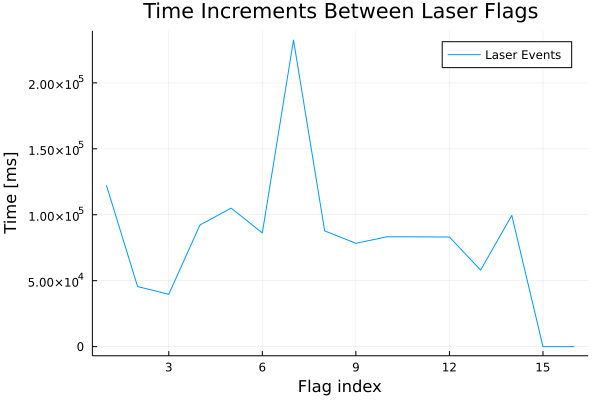

In [17]:
laser_differences = []

for i in 2:length(lfp["laser"]["on"])
    push!(laser_differences, abs(lfp["laser"]["on"][i-1] - lfp["laser"]["on"][i]))
end

plot(laser_differences, label="Laser Events")

title!("Time Increments Between Laser Flags")
xlabel!("Flag index")
ylabel!("Time [ms]")

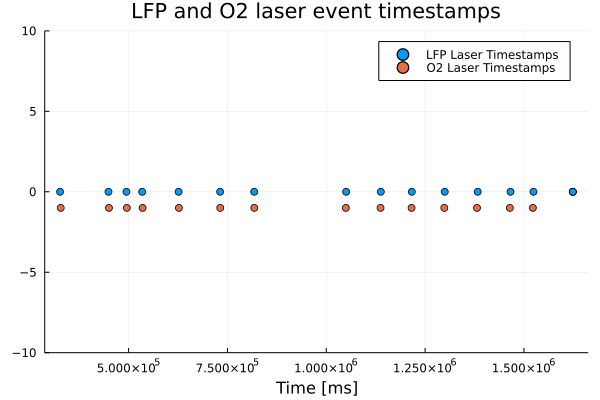

In [18]:
scatter(lfp["laser"]["on"], zeros(length(lfp["laser"]["on"])), ylim=(-10,10), label="LFP Laser Timestamps")
scatter!(o2["laser"], zeros(length(o2["laser"])).-1, label="O2 Laser Timestamps")
title!("LFP and O2 laser event timestamps")
xlabel!("Time [ms]")

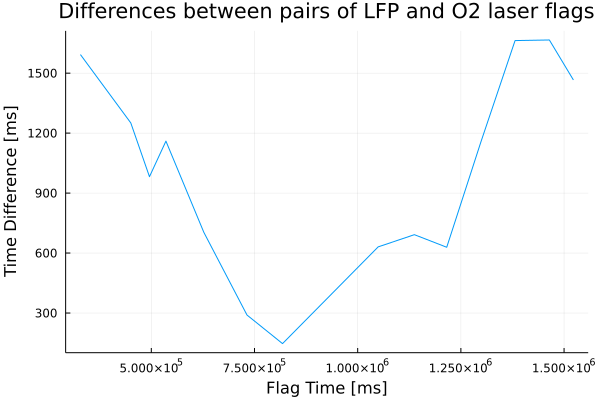

In [19]:
laser_differences = []
for i in 1:length(o2["laser"])
    push!(laser_differences, abs(o2["laser"][i] - lfp["laser"]["on"][i])) 
end
plot(o2["laser"], laser_differences)
title!("Differences between pairs of LFP and O2 laser flags", legend=false)
xlabel!("Flag Time [ms]")
ylabel!("Time Difference [ms]")